# A4130 Brunko Pavel 
# Algorithms and Big Data in Chemistry and Materials
# Retake

## 1. Validation, handling of missing values, detection of outliers, handling of duplicates, data transformation and normalization

In [1]:
# Importing all the necessary libraries to work with data 
import pandas as pd
import numpy as np
import seaborn as sbs
from sklearn import preprocessing
import matplotlib.pyplot as plt
import pubchempy as pbp 
import re
import requests
from bs4 import BeautifulSoup as bs
from mordred import Calculator
from mordred import descriptors
from rdkit.Chem import AllChem
from rdkit import Chem
from rdkit.Chem import Descriptors
from rdkit.ML.Descriptors import MoleculeDescriptors
from sklearn.cluster import DBSCAN, KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_blobs
import seaborn as sb
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

In [2]:
# Read the document with data
df = pd.read_csv('DB for chromophore_Sci_Data_rev02.csv')
df

,Tag,Chromophore,Solvent,Absorption max (nm),Emission max (nm),Lifetime (ns),Quantum yield,log(e/mol-1 dm3 cm-1),abs FWHM (cm-1),emi FWHM (cm-1),abs FWHM (nm),emi FWHM (nm),Molecular weight (g mol-1),Reference
0,1,N#Cc1cc2ccc(O)cc2oc1=O,O,355.0,410.00,2.804262,NaN,NaN,NaN,NaN,NaN,NaN,187.15370,DOI: 10.1021/acs.jpcb.5b09905
1,2,N#Cc1cc2ccc([O-])cc2oc1=O,O,408.0,450.00,3.961965,NaN,NaN,NaN,NaN,NaN,43.0,186.14576,DOI: 10.1021/acs.jpcb.5b09905
2,3,CCCCCCCCCCCC#CC#CCCCCCCCCCN1C(=O)c2ccc3c4ccc5c...,ClC(Cl)Cl,526.0,535.00,3.602954,NaN,NaN,NaN,NaN,NaN,NaN,1061.54348,https://doi.org/10.1002/smll.201901342
3,4,[O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34,CC#N,514.0,553.72,3.810000,NaN,NaN,NaN,NaN,NaN,67.4,350.42028,https://doi.org/10.1016/j.snb.2018.10.043
4,5,[O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34,CS(C)=O,524.0,555.00,4.700000,NaN,NaN,NaN,NaN,58.0,50.0,350.42028,https://doi.org/10.1016/j.snb.2018.10.043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20231,20232,N#Cc1c(N2CCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2,C1CCOC1,358.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,350.41992,DOI: 10.1021/ol9000679
20232,20233,N#Cc1c(N2CCCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2,C1CCOC1,348.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,364.44680,DOI: 10.1021/ol9000679
20233,20234,N#Cc1c(N2CCCCC2)cc(-c2cccc3ccccc23)c2c1C(=O)c1...,C1CCOC1,344.0,460.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,414.50668,DOI: 10.1021/ol9000679
20234,20235,N#Cc1c(N2CCCCC2)cc(-c2ccc3ccccc3c2)c2c1C(=O)c1...,C1CCOC1,346.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,414.50668,DOI: 10.1021/ol9000679


As we can see our dataframe has 14 columns. Also, we can see that our dataframe has a lot of missing values. Let's check which columns exactly have missing values.
Dataframe description:
- Tag - number of row;
- Chromophore - SMILES of molecule;
- Solvent;
- Absorption max (nm);
- Emission max (ns);
- Lifetime (ns);
- Quantum yeild;
- log(e/mol-1 dm3 cm-1);
- abs FWHM (cm-1);
- emi FWHM (cm-1);
- abs FWHM (nm);
- emi FWHHM (nm);
- Molecular weight (g/mol -1);
- Reference;

In [3]:
# Counting missing values in every column
df.isnull().sum ()

Tag                               0
Chromophore                       0
Solvent                           0
Absorption max (nm)            2941
Emission max (nm)              2094
Lifetime (ns)                 13276
Quantum yield                  6399
log(e/mol-1 dm3 cm-1)         12195
abs FWHM (cm-1)               19489
emi FWHM (cm-1)               19609
abs FWHM (nm)                 16644
emi FWHM (nm)                 13038
Molecular weight (g mol-1)        0
Reference                         0
dtype: int64

Only columns 'Chromophore', 'Solvent', 'Molecular weight (g mol-1)' and 'Reference' have no missing values

In [4]:
# Checking dataset for any duplicates
df.duplicated().sum()

0

In [5]:
# Let's see which our dataset has data type 
df.dtypes

Tag                             int64
Chromophore                    object
Solvent                        object
Absorption max (nm)           float64
Emission max (nm)             float64
Lifetime (ns)                 float64
Quantum yield                 float64
log(e/mol-1 dm3 cm-1)         float64
abs FWHM (cm-1)               float64
emi FWHM (cm-1)               float64
abs FWHM (nm)                 float64
emi FWHM (nm)                 float64
Molecular weight (g mol-1)    float64
Reference                      object
dtype: object

Since the columns 'abs FWHM (cm-1)' and 'emi FWHM (cm-1)' are almost empty we'll delete them from the dataset

In [6]:
# Deleting columns 'abs FWHM (cm-1)' and 'emi FWHM (cm-1)'
df.drop(['abs FWHM (cm-1)', 'emi FWHM (cm-1)'], axis=1, inplace=True)
df

,Tag,Chromophore,Solvent,Absorption max (nm),Emission max (nm),Lifetime (ns),Quantum yield,log(e/mol-1 dm3 cm-1),abs FWHM (nm),emi FWHM (nm),Molecular weight (g mol-1),Reference
0,1,N#Cc1cc2ccc(O)cc2oc1=O,O,355.0,410.00,2.804262,NaN,NaN,NaN,NaN,187.15370,DOI: 10.1021/acs.jpcb.5b09905
1,2,N#Cc1cc2ccc([O-])cc2oc1=O,O,408.0,450.00,3.961965,NaN,NaN,NaN,43.0,186.14576,DOI: 10.1021/acs.jpcb.5b09905
2,3,CCCCCCCCCCCC#CC#CCCCCCCCCCN1C(=O)c2ccc3c4ccc5c...,ClC(Cl)Cl,526.0,535.00,3.602954,NaN,NaN,NaN,NaN,1061.54348,https://doi.org/10.1002/smll.201901342
3,4,[O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34,CC#N,514.0,553.72,3.810000,NaN,NaN,NaN,67.4,350.42028,https://doi.org/10.1016/j.snb.2018.10.043
4,5,[O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34,CS(C)=O,524.0,555.00,4.700000,NaN,NaN,58.0,50.0,350.42028,https://doi.org/10.1016/j.snb.2018.10.043
...,...,...,...,...,...,...,...,...,...,...,...,...
20231,20232,N#Cc1c(N2CCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2,C1CCOC1,358.0,NaN,NaN,NaN,NaN,NaN,NaN,350.41992,DOI: 10.1021/ol9000679
20232,20233,N#Cc1c(N2CCCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2,C1CCOC1,348.0,NaN,NaN,NaN,NaN,NaN,NaN,364.44680,DOI: 10.1021/ol9000679
20233,20234,N#Cc1c(N2CCCCC2)cc(-c2cccc3ccccc23)c2c1C(=O)c1...,C1CCOC1,344.0,460.00,NaN,NaN,NaN,NaN,NaN,414.50668,DOI: 10.1021/ol9000679
20234,20235,N#Cc1c(N2CCCCC2)cc(-c2ccc3ccccc3c2)c2c1C(=O)c1...,C1CCOC1,346.0,NaN,NaN,NaN,NaN,NaN,NaN,414.50668,DOI: 10.1021/ol9000679


Further data preprocessing will be carried out after parsing the new descriptors

## 2. Parsing new desctiptors using Mordred and RDkit

Let's parse new descriptors for our molecules

a) Parsing with Mordred

In [7]:
# Select the column by which we will parse the descriptors
smiles = df['Chromophore']
# To reduce the calculation time, we will temporarily remove all duplicate smiles
smiles = smiles.drop_duplicates()
smiles = smiles.reset_index(drop = True)
smiles

0                                  N#Cc1cc2ccc(O)cc2oc1=O
1                               N#Cc1cc2ccc([O-])cc2oc1=O
2       CCCCCCCCCCCC#CC#CCCCCCCCCCN1C(=O)c2ccc3c4ccc5c...
3            [O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34
4                            CCN(CC)c1ccc2c(C)cc(=O)oc2c1
                              ...                        
6810      N#Cc1c(N2CCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2
6811     N#Cc1c(N2CCCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2
6812    N#Cc1c(N2CCCCC2)cc(-c2cccc3ccccc23)c2c1C(=O)c1...
6813    N#Cc1c(N2CCCCC2)cc(-c2ccc3ccccc3c2)c2c1C(=O)c1...
6814    N#Cc1c(N2CCCCC2)cc(-c2ccc3ccc4cccc5ccc2c3c45)c...
Name: Chromophore, Length: 6815, dtype: object

In [ ]:
# Creating an empty dataframe for new descriptors
df_mord = pd.DataFrame()
# Creating a cycle to run throught all smiles
for i in smiles:  
  # Making a descriptor's calculator
  calculus = Calculator(descriptors)
  # Get molecule from SMILES
  molec = [Chem.MolFromSmiles(i)]  
  # Calculating all descriptors for each molecule and transform it to pandas array
  calc_mol = calculus.pandas(molec)
  # Add all values to prepeared dataframe
  df_mord = pd.concat([df_mord,calc_mol])
df_mord.head(10)

In [93]:
# Saving received descriptors as Excel file to check how were parsed descriptors
df_mord.to_excel('df_mord.xlsx')

In [8]:
# Reading dataframe to further work with it 
df_mord = pd.read_excel('df_mord.xlsx')
df_mord.head()
# For correct concatenation of two dataframe add column name with SMILES to new dataframe
df_mord.insert(0, 'Chromophore', smiles)

In [9]:
# Creating separated colunm with all SMILES
smiles_ = df['Chromophore']

In [10]:
# Merging two dataframes with and without duplicates
mord_df = pd.merge(smiles_, df_mord, how='left', on='Chromophore')

In [11]:
mord_df

,Chromophore,Unnamed: 0,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,N#Cc1cc2ccc(O)cc2oc1=O,0,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,17.649595,2.398235,4.79647,17.649595,...,9.574358,45.921934,187.026943,9.843523,288,21,72,84,5.055556,3.138889
1,N#Cc1cc2ccc([O-])cc2oc1=O,0,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,1,0,17.649595,2.398235,4.79647,17.649595,...,9.574358,45.921934,186.019667,10.334426,288,21,72,84,5.055556,3.138889
2,CCCCCCCCCCCC#CC#CCCCCCCCCCN1C(=O)c2ccc3c4ccc5c...,0,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,103.461962,2.672123,5.344247,103.461962,...,11.248973,119.207874,1060.705709,6.202957,55848,128,388,452,21.75,18.472222
3,[O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34,0,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,1,0,35.995922,2.579176,5.149259,35.995922,...,10.593956,76.189551,350.064509,9.212224,1522,51,156,196,5.722222,5.416667
4,[O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34,0,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,1,0,35.995922,2.579176,5.149259,35.995922,...,10.593956,76.189551,350.064509,9.212224,1522,51,156,196,5.722222,5.416667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20231,N#Cc1c(N2CCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2,0,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,36.954046,2.606103,5.090261,36.954046,...,10.472290,78.940967,350.141913,7.780931,1571,49,152,189,6.861111,5.944444
20232,N#Cc1c(N2CCCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2,0,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,38.461847,2.605206,5.09696,38.461847,...,10.500261,78.641251,364.157563,7.586616,1749,52,156,193,7.111111,6.194444
20233,N#Cc1c(N2CCCCC2)cc(-c2cccc3ccccc23)c2c1C(=O)c1...,0,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,44.166213,2.613884,5.13144,44.166213,...,10.692059,83.481791,414.173213,7.669874,2475,62,182,227,7.833333,7.000000
20234,N#Cc1c(N2CCCCC2)cc(-c2ccc3ccccc3c2)c2c1C(=O)c1...,0,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,44.14881,2.608431,5.111982,44.14881,...,10.671858,83.445833,414.173213,7.669874,2563,61,182,226,7.833333,6.972222


As we can see from Mordred library we can download more than 1000 descriptors

In [15]:
# Saving modified dataframe as Excel file
mord_df.to_excel('mord_df.xlsx')

b) Parsing with RDkit

In [12]:
# Choosing column in initial dataframe by which we will searching new descriptors 
smil = df['Chromophore']
# To speed up the process we deleted duplicates
smil = smil.drop_duplicates()
smil = smil.reset_index(drop=True)
smil

0                                  N#Cc1cc2ccc(O)cc2oc1=O
1                               N#Cc1cc2ccc([O-])cc2oc1=O
2       CCCCCCCCCCCC#CC#CCCCCCCCCCN1C(=O)c2ccc3c4ccc5c...
3            [O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34
4                            CCN(CC)c1ccc2c(C)cc(=O)oc2c1
                              ...                        
6810      N#Cc1c(N2CCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2
6811     N#Cc1c(N2CCCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2
6812    N#Cc1c(N2CCCCC2)cc(-c2cccc3ccccc23)c2c1C(=O)c1...
6813    N#Cc1c(N2CCCCC2)cc(-c2ccc3ccccc3c2)c2c1C(=O)c1...
6814    N#Cc1c(N2CCCCC2)cc(-c2ccc3ccc4cccc5ccc2c3c45)c...
Name: Chromophore, Length: 6815, dtype: object

In [32]:
# Creating new dataframe for new descriptors
df_r = pd.DataFrame()
for i in smil:  
  # Getting molecule from SMILES
  mol = Chem.MolFromSmiles(i)
  # Creating a variable where will be calculeting all descriptors
  calc = MoleculeDescriptors.MolecularDescriptorCalculator([x[0] for x in Descriptors._descList])
  # Creating a varilable from name of descriptors
  desc_names = calc.GetDescriptorNames()
  # Creating an empty list for descriptors
  Mol_descriptors = []
  # Adding hydrogen to molecule
  mol = Chem.AddHs(mol)
  # Finding all descriptors for molecule
  descriptors = calc.CalcDescriptors(mol)
  # Adding results to list
  Mol_descriptors.append(descriptors)
  # Creating a dataframe where column names will be descriptors names and the first row is value of that descriptor
  df_rd = pd.DataFrame(Mol_descriptors, columns=desc_names)
  # Add string to main dataframe
  df_r = pd.concat([df_r,df_rd])


In [52]:
# Saving rceived result as Excel file
df_r.to_excel('df_r.xlsx')

In [13]:
# Reading saved dataframe
df_r = pd.read_excel('df_r.xlsx')

In [14]:
# Get initial column with SMILES
smil_ = df['Chromophore']

In [15]:
# Merging two dataframes 
rdkit_df = pd.merge(smil_, df_r, how='left', on='Chromophore')

In [16]:
rdkit_df

,Chromophore,Unnamed: 0,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,N#Cc1cc2ccc(O)cc2oc1=O,0,11.444838,-1.109666,11.444838,0.299120,0.631799,187.154,182.114,187.026943,...,0,0,0,0,0,0,0,0,0,0
1,N#Cc1cc2ccc([O-])cc2oc1=O,1,11.397133,-1.138861,11.397133,0.346528,0.568211,186.146,182.114,186.019667,...,0,0,0,0,0,0,0,0,0,0
2,CCCCCCCCCCCC#CC#CCCCCCCCCCN1C(=O)c2ccc3c4ccc5c...,2,15.414263,-5.499950,15.414263,1.096164,0.013057,1061.549,968.813,1060.705709,...,0,0,0,0,0,0,0,0,0,0
3,[O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34,3,13.880173,-0.899395,13.880173,0.051025,0.344339,350.422,338.326,350.064509,...,0,0,0,0,0,1,0,0,0,0
4,[O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34,3,13.880173,-0.899395,13.880173,0.051025,0.344339,350.422,338.326,350.064509,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20231,N#Cc1c(N2CCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2,6810,13.989267,-3.689420,13.989267,0.161419,0.508775,350.421,332.277,350.141913,...,0,0,0,0,0,0,0,0,0,0
20232,N#Cc1c(N2CCCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2,6811,14.100255,-3.989420,14.100255,0.354544,0.476464,364.448,344.288,364.157563,...,0,0,0,0,0,0,0,0,0,0
20233,N#Cc1c(N2CCCCC2)cc(-c2cccc3ccccc23)c2c1C(=O)c1...,6812,14.393887,-4.057783,14.393887,0.376059,0.327637,414.508,392.332,414.173213,...,0,0,0,0,0,0,0,0,0,0
20234,N#Cc1c(N2CCCCC2)cc(-c2ccc3ccccc3c2)c2c1C(=O)c1...,6813,14.339097,-4.048070,14.339097,0.375690,0.327637,414.508,392.332,414.173213,...,0,0,0,0,0,0,0,0,0,0


As we can see from RDkit library we can download 208 new descriptors

In [58]:
# Saving modified dataframe as Excel file
rdkit_df.to_excel('rdkit_df.xlsx')

In [17]:
# Reading our final dataset
final_df = pd.read_csv('final_df.csv')
final_df

,Tag,Chromophore,Solvent,Absorption max (nm),Emission max (nm),Lifetime (ns),Quantum yield,log(e/mol-1 dm3 cm-1),abs FWHM (cm-1),emi FWHM (cm-1),...,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb2
0,1,N#Cc1cc2ccc(O)cc2oc1=O,O,355.0,410.00,2.804262,NaN,NaN,NaN,NaN,...,0.000000,9.574358,45.921934,187.026943,9.843523,288,21,72,84,3.138889
1,2,N#Cc1cc2ccc([O-])cc2oc1=O,O,408.0,450.00,3.961965,NaN,NaN,NaN,NaN,...,0.000000,9.574358,45.921934,186.019667,10.334426,288,21,72,84,3.138889
2,3,CCCCCCCCCCCC#CC#CCCCCCCCCCN1C(=O)c2ccc3c4ccc5c...,ClC(Cl)Cl,526.0,535.00,3.602954,NaN,NaN,NaN,NaN,...,0.000000,11.248973,119.207874,1060.705709,6.202957,55848,128,388,452,18.472222
3,4,[O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34,CC#N,514.0,553.72,3.810000,NaN,NaN,NaN,NaN,...,6.842683,10.593956,76.189551,350.064509,9.212224,1522,51,156,196,5.416667
4,5,[O-]c1c(-c2nc3ccccc3s2)cc2ccc3cccc4ccc1c2c34,CS(C)=O,524.0,555.00,4.700000,NaN,NaN,NaN,NaN,...,6.842683,10.593956,76.189551,350.064509,9.212224,1522,51,156,196,5.416667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20231,20232,N#Cc1c(N2CCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2,C1CCOC1,358.0,NaN,NaN,NaN,NaN,NaN,NaN,...,7.573017,10.472290,78.940967,350.141913,7.780931,1571,49,152,189,5.944444
20232,20233,N#Cc1c(N2CCCCC2)cc(-c2ccccc2)c2c1C(=O)c1ccccc1-2,C1CCOC1,348.0,NaN,NaN,NaN,NaN,NaN,NaN,...,7.247793,10.500261,78.641251,364.157563,7.586616,1749,52,156,193,6.194444
20233,20234,N#Cc1c(N2CCCCC2)cc(-c2cccc3ccccc23)c2c1C(=O)c1...,C1CCOC1,344.0,460.00,NaN,NaN,NaN,NaN,NaN,...,7.247793,10.692059,83.481791,414.173213,7.669874,2475,62,182,227,7.000000
20234,20235,N#Cc1c(N2CCCCC2)cc(-c2ccc3ccccc3c2)c2c1C(=O)c1...,C1CCOC1,346.0,NaN,NaN,NaN,NaN,NaN,NaN,...,7.247793,10.671858,83.445833,414.173213,7.669874,2563,61,182,226,6.972222


In the end we parsed more than 1300 new descriptors from RDkit and Mordred libraries

In [18]:
final_df.isnull().sum()

Tag                       0
Chromophore               0
Solvent                   0
Absorption max (nm)    2941
Emission max (nm)      2094
                       ... 
WPath                     0
WPol                      0
Zagreb1                   0
Zagreb2                   0
mZagreb2                  0
Length: 1348, dtype: int64

Since more than 50% of the values are missing in the 'Lifetime (ns)', 'log(e/mol-1 dm3 cm-1)', 'abs FWHM (nm)' and 'emi FWHM (nm)' columns, we will delete these columns

In [19]:
# Deleting columns 'Lifetime (ns)', 'log(e/mol-1 dm3 cm-1)', 'abs FWHM (nm)', 'emi FWHM (nm)', 'abs FWHM (cm-1)', 'emi FWHM (cm-1)'. Also we don't column 'Tag', 'Reference', 'Chromophore' and 'Solvent' anymore
final_df.drop(['Lifetime (ns)', 'log(e/mol-1 dm3 cm-1)', 'abs FWHM (nm)', 'emi FWHM (nm)', 'abs FWHM (cm-1)', 'emi FWHM (cm-1)', 'Reference', 'Chromophore', 'Solvent', 'Tag'], axis=1, inplace=True)
final_df

,Absorption max (nm),Emission max (nm),Quantum yield,Molecular weight (g mol-1),MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,...,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb2
0,355.0,410.00,NaN,187.1537,11.444838,-1.109666,11.444838,0.299120,0.631799,187.154,...,0.000000,9.574358,45.921934,187.026943,9.843523,288,21,72,84,3.138889
1,408.0,450.00,NaN,186.1458,11.397133,-1.138861,11.397133,0.346528,0.568211,186.146,...,0.000000,9.574358,45.921934,186.019667,10.334426,288,21,72,84,3.138889
2,526.0,535.00,NaN,1061.5430,15.414263,-5.499950,15.414263,1.096164,0.013057,1061.549,...,0.000000,11.248973,119.207874,1060.705709,6.202957,55848,128,388,452,18.472222
3,514.0,553.72,NaN,350.4203,13.880173,-0.899395,13.880173,0.051025,0.344339,350.422,...,6.842683,10.593956,76.189551,350.064509,9.212224,1522,51,156,196,5.416667
4,524.0,555.00,NaN,350.4203,13.880173,-0.899395,13.880173,0.051025,0.344339,350.422,...,6.842683,10.593956,76.189551,350.064509,9.212224,1522,51,156,196,5.416667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20231,358.0,NaN,NaN,350.4199,13.989267,-3.689420,13.989267,0.161419,0.508775,350.421,...,7.573017,10.472290,78.940967,350.141913,7.780931,1571,49,152,189,5.944444
20232,348.0,NaN,NaN,364.4468,14.100255,-3.989420,14.100255,0.354544,0.476464,364.448,...,7.247793,10.500261,78.641251,364.157563,7.586616,1749,52,156,193,6.194444
20233,344.0,460.00,NaN,414.5067,14.393887,-4.057783,14.393887,0.376059,0.327637,414.508,...,7.247793,10.692059,83.481791,414.173213,7.669874,2475,62,182,227,7.000000
20234,346.0,NaN,NaN,414.5067,14.339097,-4.048070,14.339097,0.375690,0.327637,414.508,...,7.247793,10.671858,83.445833,414.173213,7.669874,2563,61,182,226,6.972222


We will fill the other columns with fewer missing values with the average value for the entire column

In [20]:
# Calculating mean values of columns with NaN
mean_quant_yl = final_df['Quantum yield'].mean()
print(mean_quant_yl)
mean_abs_max = final_df['Absorption max (nm)'].mean()
print(mean_abs_max)
mean_emi_max = final_df['Emission max (nm)'].mean()
print(mean_emi_max)

0.34502456334465564
427.6168678115062
500.24357366883476


In [21]:
# Filling in the missing values
final_df['Quantum yield'] = final_df['Quantum yield'].fillna(mean_quant_yl) 
final_df['Absorption max (nm)'] = final_df['Absorption max (nm)'].fillna(mean_abs_max)
final_df['Emission max (nm)'] = final_df['Emission max (nm)'].fillna(mean_emi_max)
final_df

,Absorption max (nm),Emission max (nm),Quantum yield,Molecular weight (g mol-1),MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,...,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb2
0,355.0,410.000000,0.345025,187.1537,11.444838,-1.109666,11.444838,0.299120,0.631799,187.154,...,0.000000,9.574358,45.921934,187.026943,9.843523,288,21,72,84,3.138889
1,408.0,450.000000,0.345025,186.1458,11.397133,-1.138861,11.397133,0.346528,0.568211,186.146,...,0.000000,9.574358,45.921934,186.019667,10.334426,288,21,72,84,3.138889
2,526.0,535.000000,0.345025,1061.5430,15.414263,-5.499950,15.414263,1.096164,0.013057,1061.549,...,0.000000,11.248973,119.207874,1060.705709,6.202957,55848,128,388,452,18.472222
3,514.0,553.720000,0.345025,350.4203,13.880173,-0.899395,13.880173,0.051025,0.344339,350.422,...,6.842683,10.593956,76.189551,350.064509,9.212224,1522,51,156,196,5.416667
4,524.0,555.000000,0.345025,350.4203,13.880173,-0.899395,13.880173,0.051025,0.344339,350.422,...,6.842683,10.593956,76.189551,350.064509,9.212224,1522,51,156,196,5.416667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20231,358.0,500.243574,0.345025,350.4199,13.989267,-3.689420,13.989267,0.161419,0.508775,350.421,...,7.573017,10.472290,78.940967,350.141913,7.780931,1571,49,152,189,5.944444
20232,348.0,500.243574,0.345025,364.4468,14.100255,-3.989420,14.100255,0.354544,0.476464,364.448,...,7.247793,10.500261,78.641251,364.157563,7.586616,1749,52,156,193,6.194444
20233,344.0,460.000000,0.345025,414.5067,14.393887,-4.057783,14.393887,0.376059,0.327637,414.508,...,7.247793,10.692059,83.481791,414.173213,7.669874,2475,62,182,227,7.000000
20234,346.0,500.243574,0.345025,414.5067,14.339097,-4.048070,14.339097,0.375690,0.327637,414.508,...,7.247793,10.671858,83.445833,414.173213,7.669874,2563,61,182,226,6.972222


Now that we have a large amount of data cleared of missing values, we need to normalize the data. Data normalization is necessary in order to bring all descriptors to the same range of values, namely [0; 1]. Normalization allows different descriptors with different dimensions to make the same contribution to the analysis, which will greatly simplify the interpretation of the latter

In [22]:
# Filling in all Nan-values to zero
final_df = final_df.fillna(0)

In [23]:
# Normalizing all dataframe
final_df_norm = final_df.copy()
for column in final_df_norm:
    final_df_norm[column] = (final_df_norm[column] - final_df_norm[column].min()) / (final_df_norm[column].max() - final_df_norm[column].min())

In [24]:
# Checking normalized dataframe
final_df_norm

,Absorption max (nm),Emission max (nm),Quantum yield,Molecular weight (g mol-1),MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,...,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb2
0,0.245115,0.202989,0.345025,0.084024,0.442679,0.651126,0.442679,0.072759,0.667114,0.084023,...,0.000000,0.758570,0.211635,0.084034,0.053657,1.858064e-08,0.070234,0.082759,0.076294,0.086990
1,0.302270,0.252802,0.345025,0.083529,0.440519,0.649175,0.440519,0.084291,0.598722,0.083528,...,0.000000,0.758570,0.211635,0.083539,0.057625,1.858064e-08,0.070234,0.082759,0.076294,0.086990
2,0.429518,0.358655,0.345025,0.513390,0.622383,0.357749,0.622383,0.266634,0.001629,0.513389,...,0.000000,0.891248,0.556898,0.513394,0.024226,3.603096e-06,0.428094,0.445977,0.410536,0.511932
3,0.416578,0.381968,0.345025,0.164195,0.552932,0.665177,0.552932,0.012411,0.357937,0.164195,...,0.679668,0.839352,0.354231,0.164157,0.048553,9.819353e-08,0.170569,0.179310,0.178020,0.150115
4,0.427361,0.383562,0.345025,0.164195,0.552932,0.665177,0.552932,0.012411,0.357937,0.164195,...,0.679668,0.839352,0.354231,0.164157,0.048553,9.819353e-08,0.170569,0.179310,0.178020,0.150115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20231,0.248351,0.315372,0.345025,0.164195,0.557871,0.478736,0.557871,0.039264,0.534796,0.164194,...,0.752210,0.829712,0.367194,0.164195,0.036982,1.013548e-07,0.163880,0.174713,0.171662,0.164742
20232,0.237567,0.315372,0.345025,0.171083,0.562895,0.458689,0.562895,0.086240,0.500045,0.171082,...,0.719906,0.831929,0.365782,0.171083,0.035412,1.128387e-07,0.173913,0.179310,0.175295,0.171671
20233,0.233253,0.265255,0.345025,0.195664,0.576189,0.454120,0.576189,0.091474,0.339975,0.195664,...,0.719906,0.847125,0.388586,0.195663,0.036085,1.596774e-07,0.207358,0.209195,0.206176,0.193995
20234,0.235410,0.315372,0.345025,0.195664,0.573708,0.454769,0.573708,0.091384,0.339975,0.195664,...,0.719906,0.845524,0.388417,0.195663,0.036085,1.653548e-07,0.204013,0.209195,0.205268,0.193226


Now all descriptors have taken values in the range [0;1].
 After normalization we can find and remove outliers in dataframe

In [25]:
# Let's see statistics of our dataframe
final_df_norm.describe()

,Absorption max (nm),Emission max (nm),Quantum yield,Molecular weight (g mol-1),MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,...,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb2
count,20236.000000,20236.000000,20236.000000,20236.000000,20236.000000,20236.000000,20236.000000,20236.000000,20236.000000,20236.000000,...,20236.000000,20236.000000,20236.000000,20236.000000,20236.000000,2.023600e+04,20236.000000,20236.000000,20236.000000,20236.000000
mean,0.323424,0.315372,0.345025,0.225435,0.477467,0.466768,0.477470,0.093715,0.399226,0.225428,...,0.430871,0.831724,0.374034,0.225416,0.038926,1.176874e-03,0.210429,0.222350,0.213555,0.211402
std,0.105778,0.111005,0.254595,0.121388,0.134685,0.118234,0.134683,0.085648,0.249862,0.121382,...,0.367897,0.052991,0.111766,0.121372,0.016808,3.136187e-02,0.126254,0.121013,0.119118,0.111120
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,0.250507,0.232877,0.130000,0.143545,0.352370,0.381096,0.352370,0.032550,0.181135,0.143544,...,0.000000,0.800696,0.301085,0.143545,0.032983,7.206450e-08,0.123746,0.137931,0.131698,0.137028
50%,0.310897,0.315372,0.345025,0.197615,0.481456,0.467128,0.481456,0.070366,0.344096,0.197614,...,0.679668,0.834761,0.356531,0.197538,0.037160,1.608387e-07,0.180602,0.193103,0.185286,0.183218
75%,0.356188,0.375910,0.430000,0.267912,0.563795,0.517606,0.563795,0.126854,0.620242,0.267911,...,0.750355,0.863275,0.427286,0.267930,0.041900,3.902257e-07,0.257525,0.268966,0.258856,0.256351
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000


In [26]:
# Checking dataframe for duplites
final_df_norm.duplicated().sum()

682

In [27]:
# Remove duplicates from dataframe
clear_df = final_df_norm.drop_duplicates()
clear_df

,Absorption max (nm),Emission max (nm),Quantum yield,Molecular weight (g mol-1),MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,...,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb2
0,0.245115,0.202989,0.345025,0.084024,0.442679,0.651126,0.442679,0.072759,0.667114,0.084023,...,0.000000,0.758570,0.211635,0.084034,0.053657,1.858064e-08,0.070234,0.082759,0.076294,0.086990
1,0.302270,0.252802,0.345025,0.083529,0.440519,0.649175,0.440519,0.084291,0.598722,0.083528,...,0.000000,0.758570,0.211635,0.083539,0.057625,1.858064e-08,0.070234,0.082759,0.076294,0.086990
2,0.429518,0.358655,0.345025,0.513390,0.622383,0.357749,0.622383,0.266634,0.001629,0.513389,...,0.000000,0.891248,0.556898,0.513394,0.024226,3.603096e-06,0.428094,0.445977,0.410536,0.511932
3,0.416578,0.381968,0.345025,0.164195,0.552932,0.665177,0.552932,0.012411,0.357937,0.164195,...,0.679668,0.839352,0.354231,0.164157,0.048553,9.819353e-08,0.170569,0.179310,0.178020,0.150115
4,0.427361,0.383562,0.345025,0.164195,0.552932,0.665177,0.552932,0.012411,0.357937,0.164195,...,0.679668,0.839352,0.354231,0.164157,0.048553,9.819353e-08,0.170569,0.179310,0.178020,0.150115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20231,0.248351,0.315372,0.345025,0.164195,0.557871,0.478736,0.557871,0.039264,0.534796,0.164194,...,0.752210,0.829712,0.367194,0.164195,0.036982,1.013548e-07,0.163880,0.174713,0.171662,0.164742
20232,0.237567,0.315372,0.345025,0.171083,0.562895,0.458689,0.562895,0.086240,0.500045,0.171082,...,0.719906,0.831929,0.365782,0.171083,0.035412,1.128387e-07,0.173913,0.179310,0.175295,0.171671
20233,0.233253,0.265255,0.345025,0.195664,0.576189,0.454120,0.576189,0.091474,0.339975,0.195664,...,0.719906,0.847125,0.388586,0.195663,0.036085,1.596774e-07,0.207358,0.209195,0.206176,0.193995
20234,0.235410,0.315372,0.345025,0.195664,0.573708,0.454769,0.573708,0.091384,0.339975,0.195664,...,0.719906,0.845524,0.388417,0.195663,0.036085,1.653548e-07,0.204013,0.209195,0.205268,0.193226


## 3. Visual analysis of the dataframe

To successfully analyze the data, we need to reduce the number of descriptors. Now there are more than 1300 of them, so it is extremely difficult to analyze. To reduce the dimension of the dataframe, we use the PCA method

In [28]:
# Filing in all missing values
clear_df = clear_df.fillna(0)

In [29]:
# Scale data before applying PCA
scaling = StandardScaler() 
# Use fit and transform method
scaling.fit(clear_df)
scaled_data = scaling.transform(clear_df)
# Set the n_components with variance 0.60%
principal = PCA(n_components=0.60)
principal.fit(scaled_data)
low_dim_df = principal.transform(scaled_data)
# Check the dimensions of data after PCA
print(low_dim_df.shape)

(19554, 19)


In [30]:
# Since the output data from the algorithm written above is represented in a numpy array, we will translate it into a dataframe
low_dim_df = pd.DataFrame(low_dim_df)
low_dim_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,-21.028643,7.651470,2.349509,-6.632441,-0.816431,-0.156312,2.590345,-6.975557,7.494823,-5.549221,1.968303,8.964559,-9.596122,-1.873385,3.155887,-5.518716,-9.690134,-1.136688,-2.214307
1,-20.914664,8.828277,4.845999,-8.905751,-2.851390,3.324950,1.997077,-8.361401,6.239155,-6.190279,3.339273,14.338469,-14.193765,-2.612188,7.072672,-2.494628,-15.478365,0.277163,-4.066164
2,33.423688,-10.274384,-14.620201,-4.730153,-7.582527,-5.462745,7.908996,12.063989,11.374179,3.943060,-4.362674,-3.696881,2.430827,-4.582317,-3.034311,-3.935225,-1.441546,-3.972628,-4.518425
3,-5.749945,2.271913,13.437437,-1.093715,4.639463,-2.021231,-1.242928,0.927313,0.932855,1.567329,-3.744502,-0.128882,-2.838190,1.219059,-2.181562,0.071735,-1.884564,0.414131,-4.627550
4,-5.747676,2.275698,13.435058,-1.091433,4.639659,-2.022532,-1.241150,0.929958,0.929214,1.569674,-3.741742,-0.130732,-2.838462,1.223686,-2.184504,0.073786,-1.890418,0.410421,-4.631020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19549,-4.366866,1.223643,3.806202,1.550191,1.991772,-13.097218,-0.399305,4.339237,5.434053,3.024582,0.368868,2.010204,-0.064939,0.548689,-1.607326,-0.574174,-2.715585,-1.545071,-1.108881
19550,-3.319276,-0.105214,2.295983,0.679859,1.931942,-13.965873,0.057367,4.240799,5.286141,3.698709,0.841741,1.093710,0.420724,0.745151,-2.070343,-0.125556,-2.434376,-1.488380,-0.298235
19551,0.590471,-0.381138,3.504489,-0.373668,3.248259,-11.905159,-0.358248,3.386205,3.243278,4.925519,0.094995,-0.666518,1.072721,2.216812,-2.819571,-1.138195,-2.450248,-2.376662,-0.463442
19552,0.059189,-0.754975,3.313707,-0.444601,2.436919,-11.197879,-0.161701,2.546030,3.294368,3.872908,0.846865,0.679578,0.249877,1.616195,-2.246005,-0.182161,-2.870453,-2.264479,-1.041469


Now we have only twelve features, which can be much more easier to analyse 

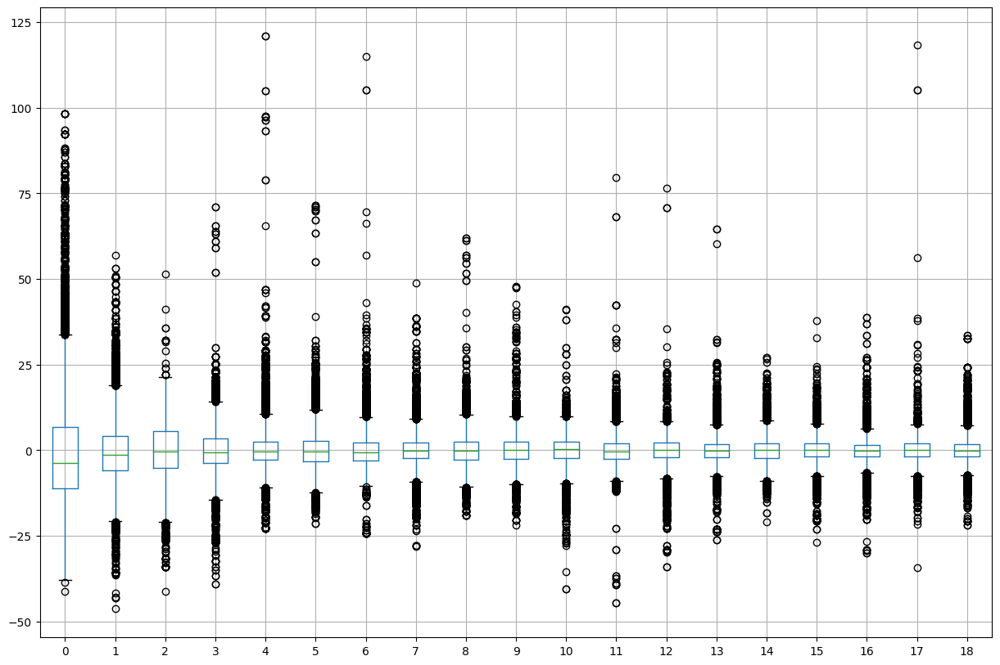

In [31]:
# Creating boxplots for received data
low_dim_df.boxplot(figsize=(15,10))
plt.show()

We can see a few outliers in dataframe. Remote them for getting better analysis results

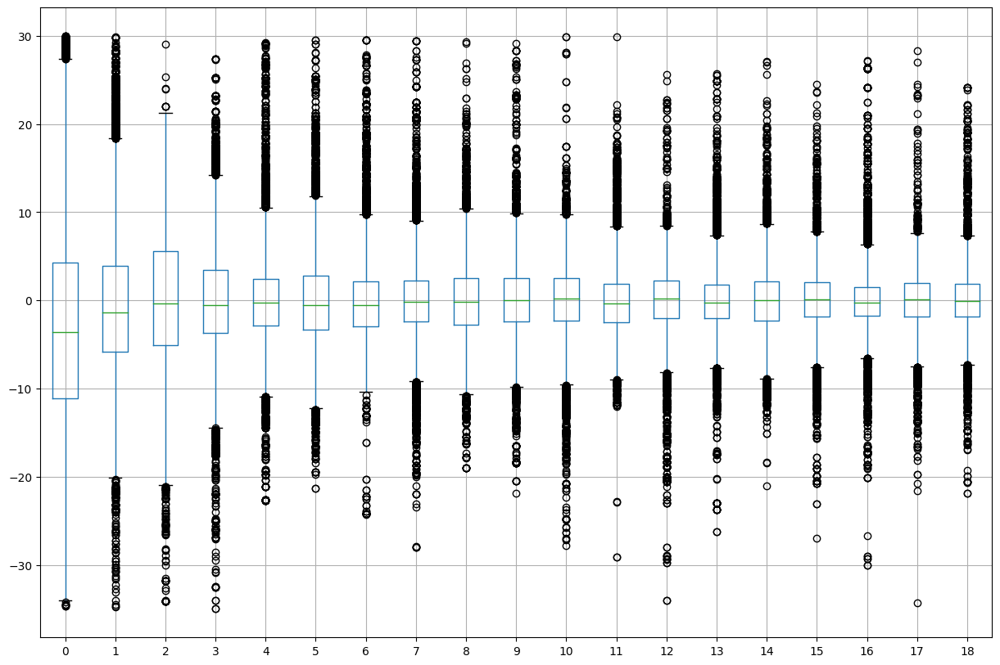

In [32]:
# Deleting outliers
clear_lowdim_df = low_dim_df.where(low_dim_df < 30, other = 0)
clear_lowdim_df1 = clear_lowdim_df.where(clear_lowdim_df > -35, other = 0)
clear_lowdim_df1.boxplot(figsize=(15,10))
plt.show()

Now we can finally analyse our data

As it was seen from the boxplots, each descriptor in the dataframe is generally distributed normally. However, the boxplots may not reflect dips in the descriptor values in the area of the average value. To make sure that the distribution of descriptors is normal, we will plot the density of distributions and histogram for each descriptor

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


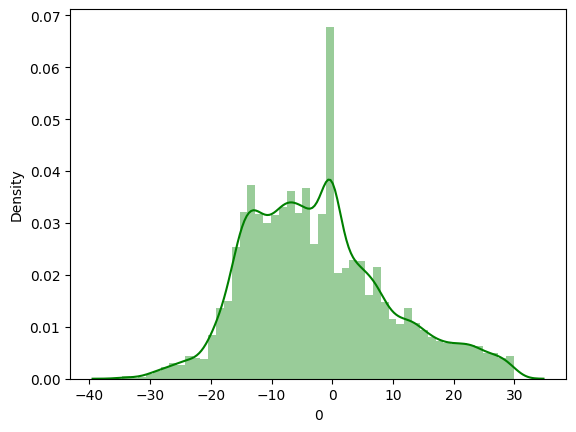

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


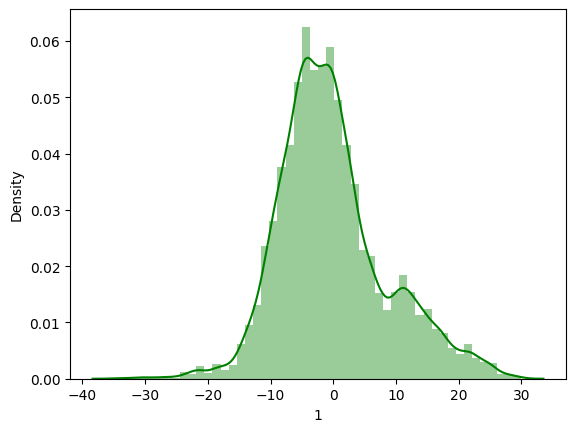

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


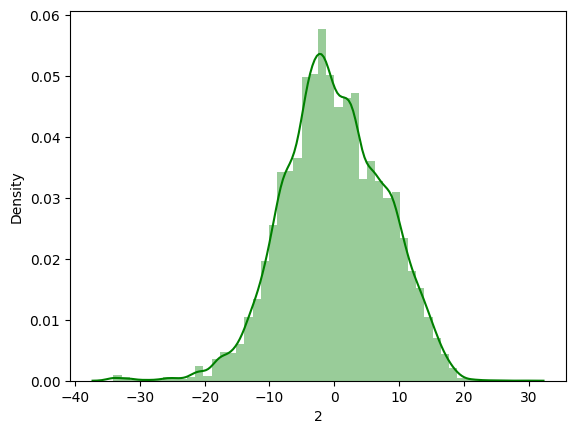

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


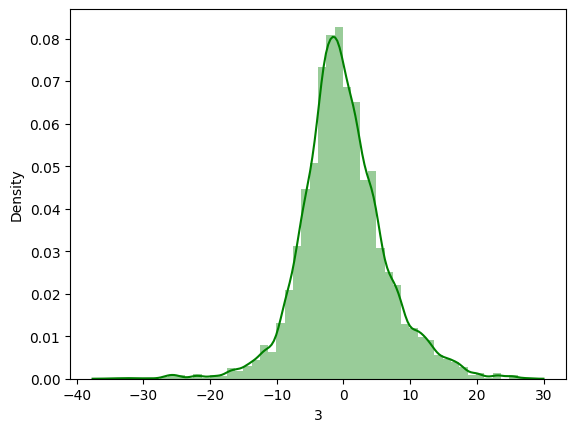

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


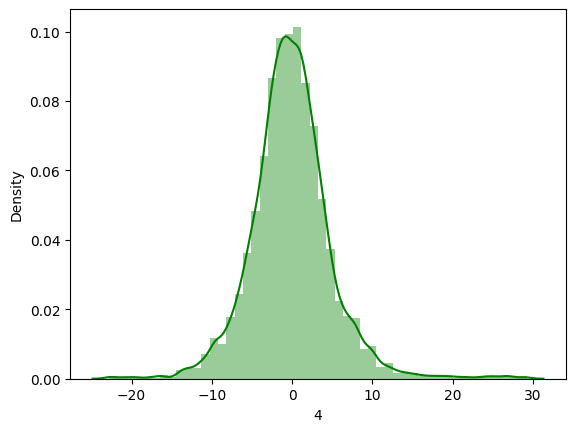

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


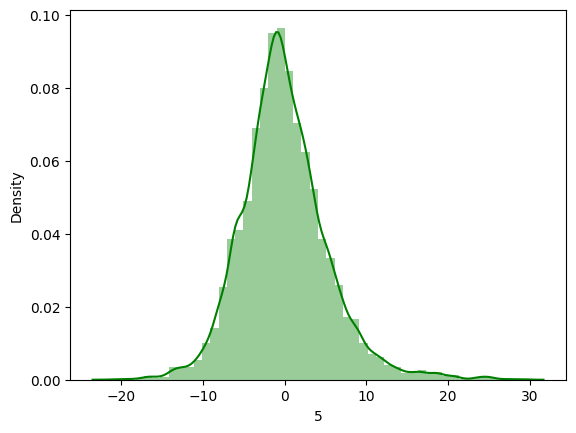

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


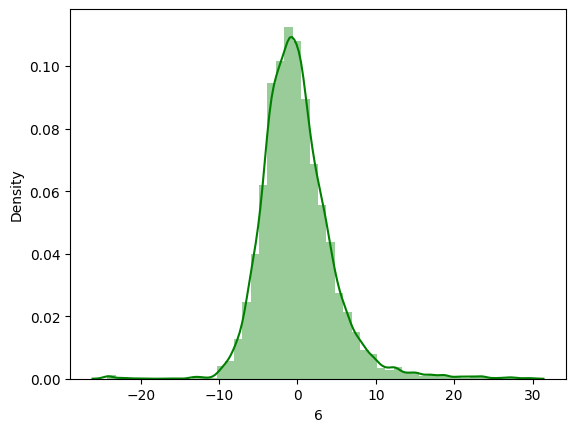

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


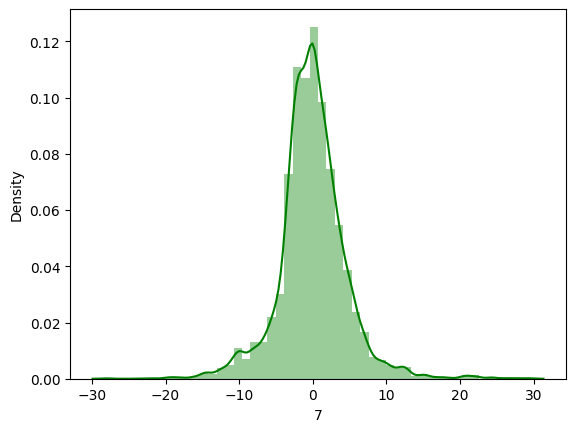

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


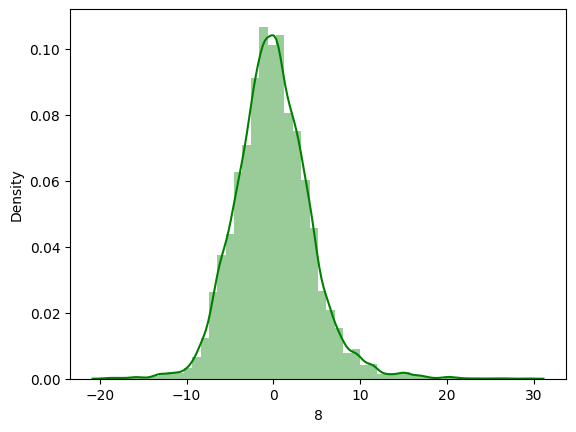

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


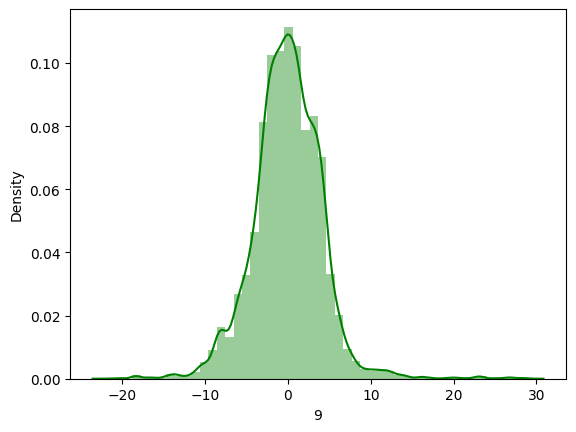

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


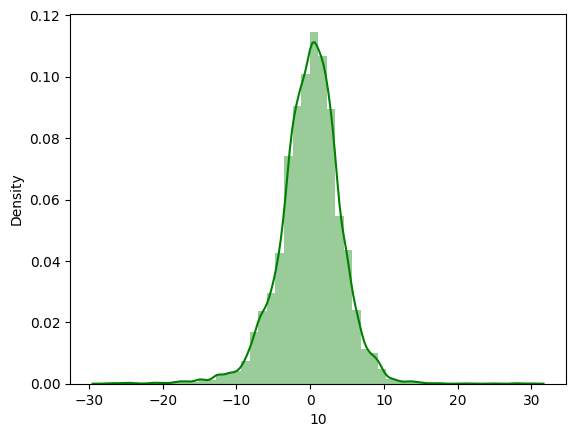

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


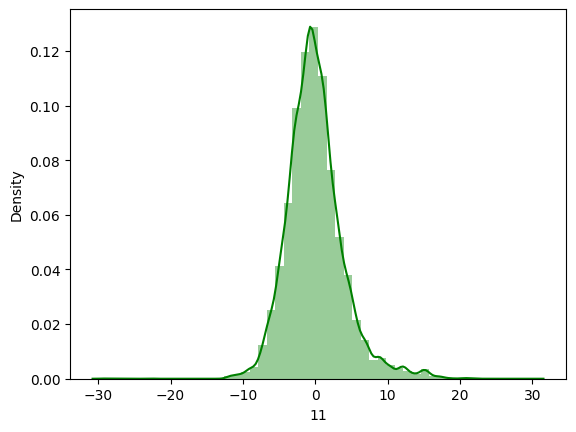

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


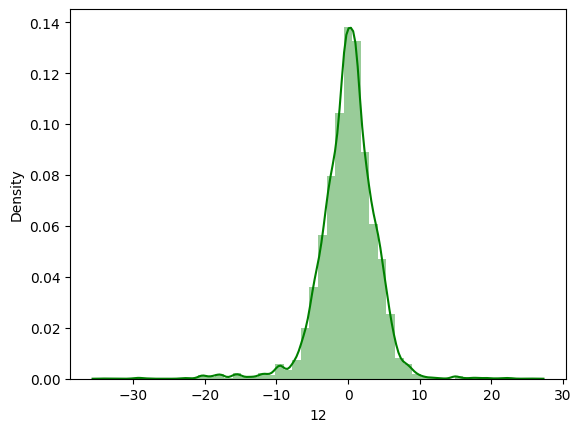

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


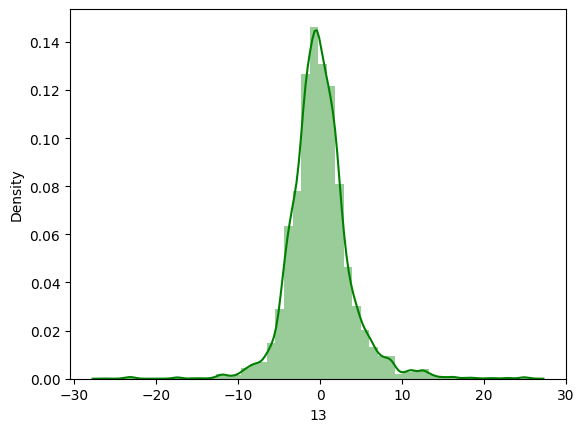

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


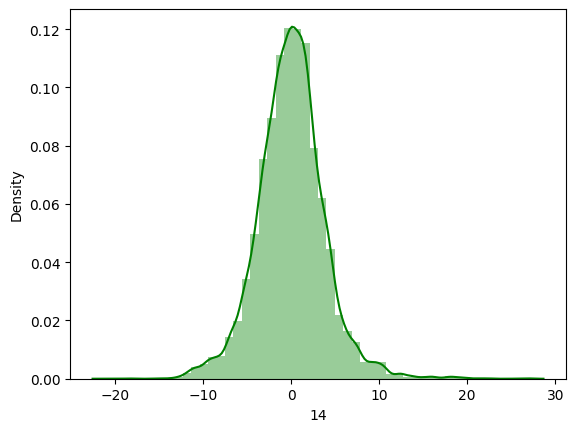

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


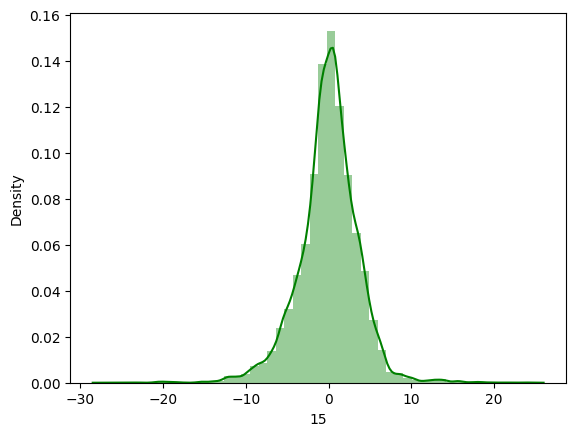

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


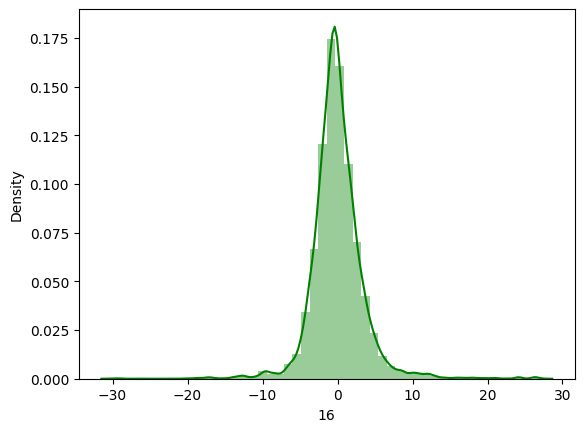

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


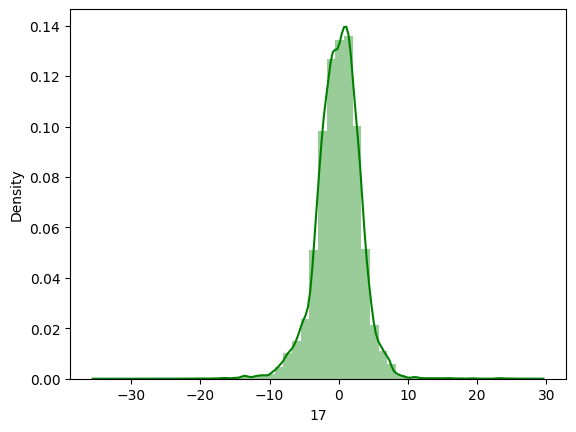

/var/folders/qq/gt96f0sx7nn6wsr9d8n13r2w0000gn/T/ipykernel_36317/2057824740.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbs.distplot(clear_lowdim_df1[i], color='green')


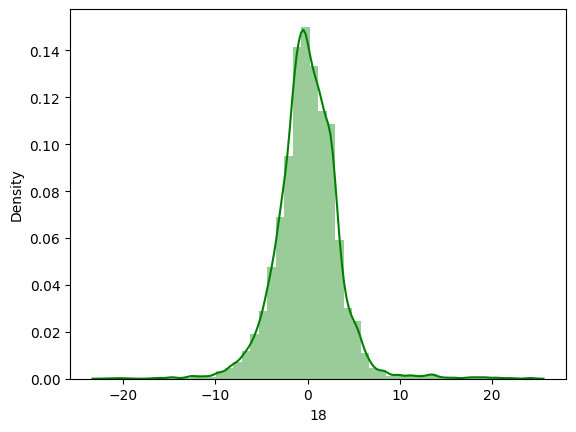

In [33]:
# Creating density plot and histogram for each descriptor
for i in range(19):
    sbs.distplot(clear_lowdim_df1[i], color='green')
    plt.show()

Now we can say with confidence that our descriptors are distributed normally (approximately normally in the case of descriptors 0 and 1)

Also, to check the normality of the distribution of descriptor values, we can build violin plots

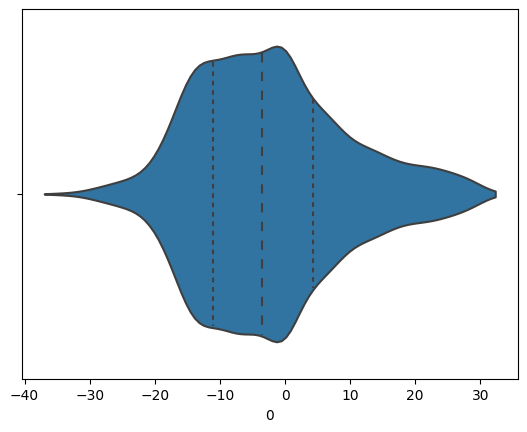

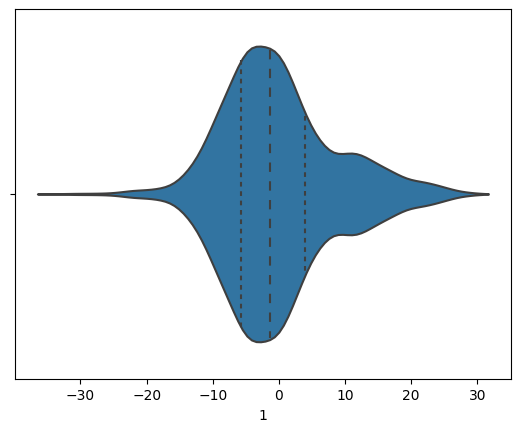

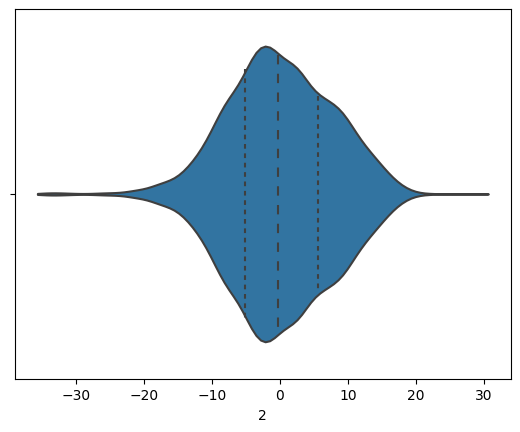

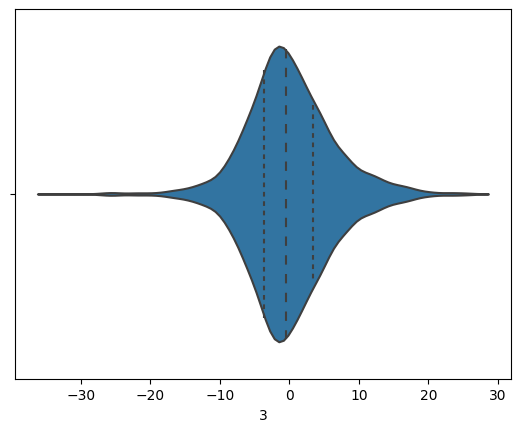

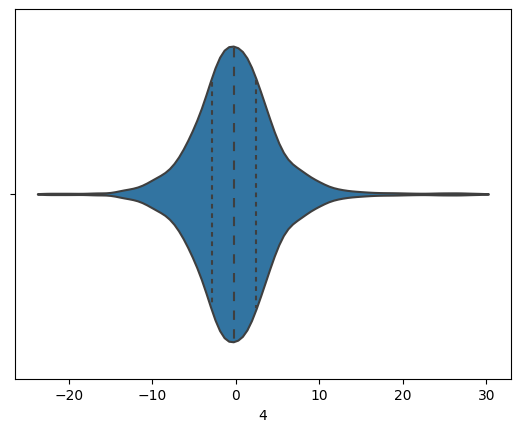

...

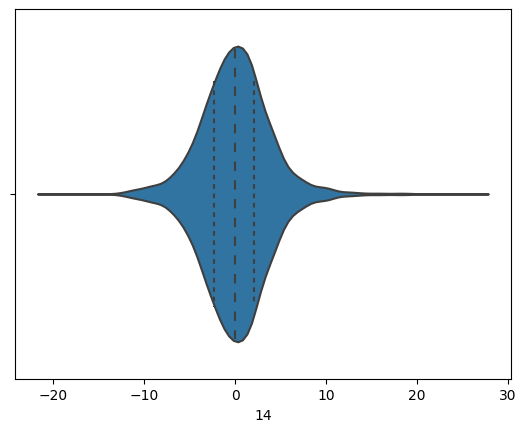

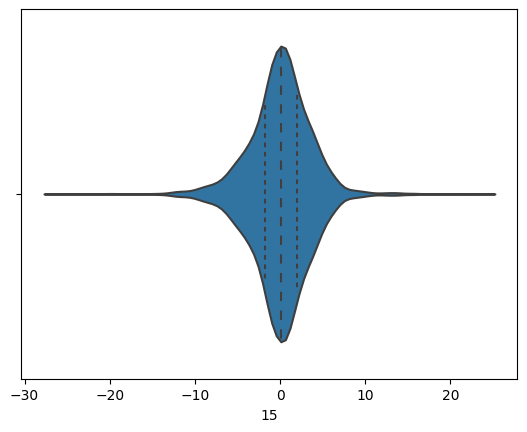

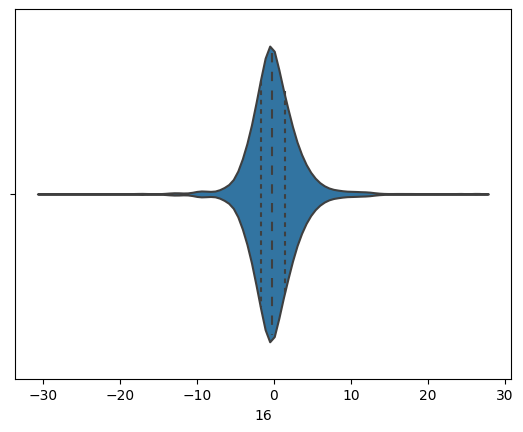

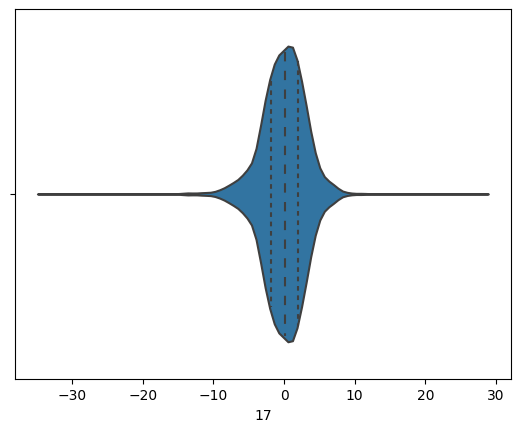

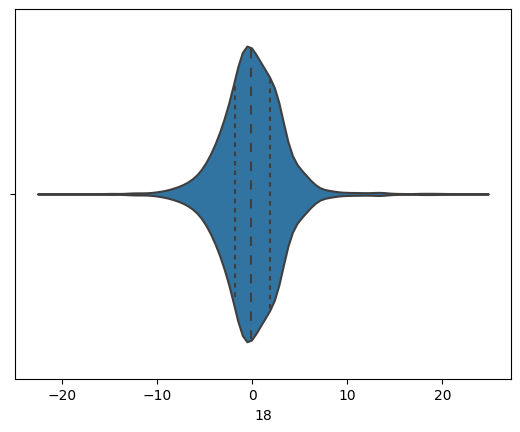

In [34]:
# Creating violin plots for each descriptor
for i in range(19):
    sbs.violinplot(x=clear_lowdim_df1[i], bw=.2, cut=1, linewidth=1.5, inner="quartile")
    plt.show()

Once again we see the normal distribution of values

Next, we will create a pairwise plot to show how the values of different descriptors in the dataframe relate to each other


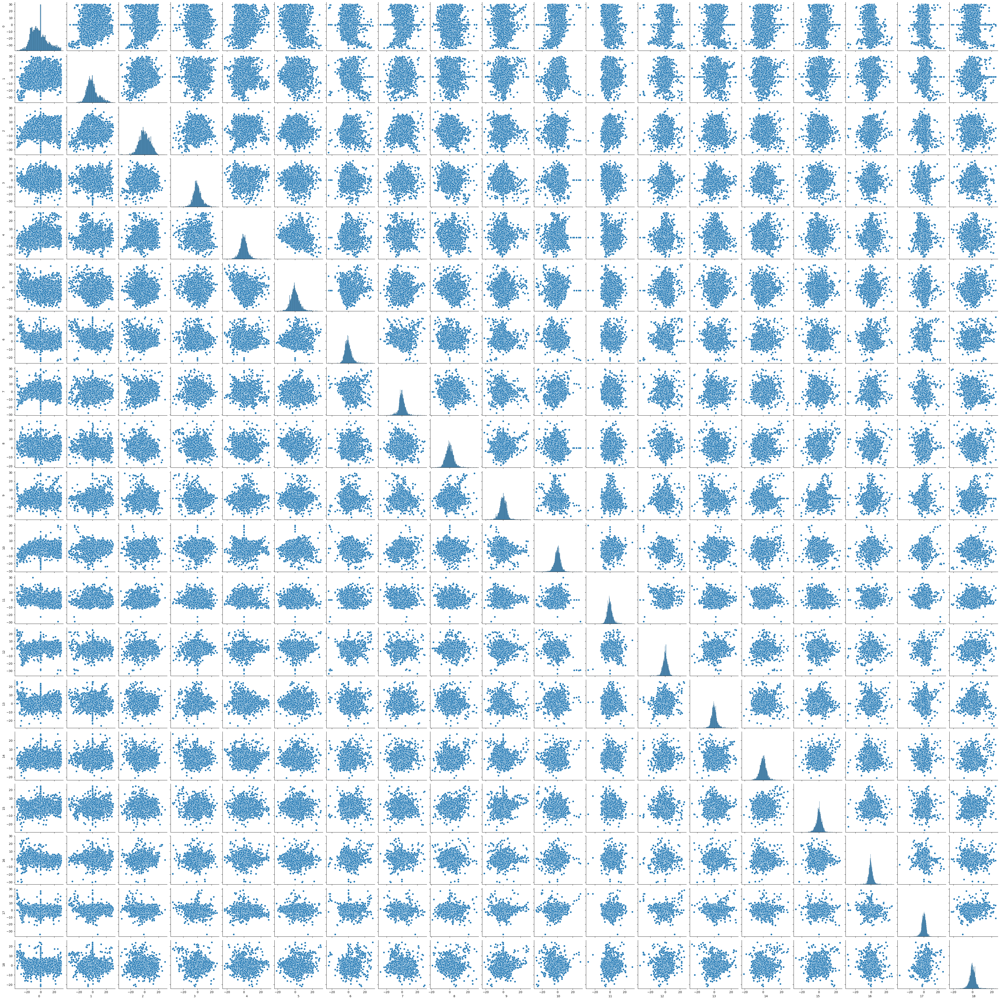

In [35]:
# Сreating a pairwise plot
sbs.pairplot(clear_lowdim_df1)
plt.show()

As can be seen from the graph, the descriptors are distributed as a whole independently of each other. Only sometimes you can notice a weak dependence

## 4. Investigation of correlation coefficients and multicollinearity

Multicollinearity in regression analysis occurs when two or more predictor variables are strongly correlated with each other, so that they do not provide unique or independent information in the regression model.

If the degree of correlation between the variables is high enough, this can cause problems in fitting and interpreting the regression model.

The degree of correlation of descriptors in the dataframe can be found through heatmap. Let's build the corresponding diagram

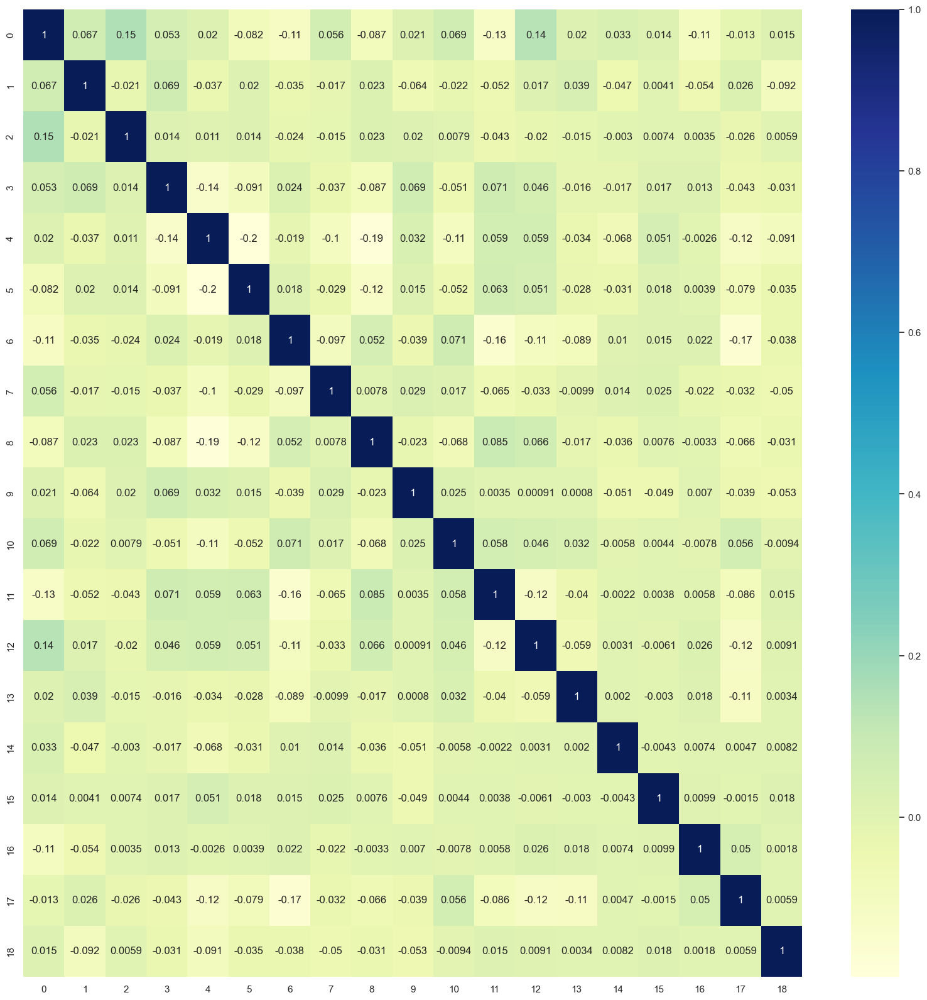

In [36]:
# Creating a heatmap for dataframe
sbs.set(rc={'figure.figsize':(20,20)})
sbs.heatmap(clear_lowdim_df1.corr(), cmap="YlGnBu", annot=True) 
plt.show()

As can be seen from the diagram, the values of the descriptors either do not correlate with each other at all, or there is an extremely weak correlation

To confirm the absence of correlation in the dataframe, we will also calculate the VIF (coefficient of variance inflation). The values of this coefficient are empirically interpreted as follows: IF = 1 - there is no correlation, 1 < VIF < 5 - there is a weak correlation and VIF > 5 - there is a correlation

In [37]:
# Get variables for which to compute VIF and add intercept term
X = sm.add_constant(clear_lowdim_df1)
# Compute and view VIF
vif = pd.DataFrame()
vif["variables"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif

,variables,VIF
0,const,1.050439
1,0,1.119273
2,1,1.040074
3,2,1.037356
4,3,1.132629
5,4,1.300247
6,5,1.188864
7,6,1.179766
8,7,1.054514
9,8,1.193748


The obtained VIF values can be interpreted as the absence of correlation between the descriptors. Only in the case of the descriptor 5 (VIF = 1.5) can we talk about the presence of a weak dependence

## 5. Selection of parameters

Based on the coefficients calculated above and the constructed heatmap with built-in Pearson coefficients, we can conclude that there is no multicollinearity in the 19 descriptors obtained by the PCA method (from the 1300+ previously present). It follows from this that we can use all the received descriptors in the future